In [40]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision import transforms
from timm import create_model
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import mean_squared_error, r2_score

# 1. Dataset Class
class CephalometricDataset(Dataset):
    def __init__(self, csv_file, image_folder, transform=None):
        self.landmarks_frame = pd.read_csv(csv_file)
        self.image_folder = image_folder
        self.transform = transform

    def __len__(self):
        return len(self.landmarks_frame)

    def __getitem__(self, idx):
        image_name = self.landmarks_frame.iloc[idx, 1]
        image_path = f'{self.image_folder}/{image_name}'
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        image = cv2.resize(image, (256, 256))
        landmarks = self.landmarks_frame.iloc[idx, 4:].values.astype('float32').reshape(-1, 2)

        if self.transform:
            image = self.transform(image)

        # Add a new channel dimension for HRNet compatibility
        image = image.unsqueeze(0)
        return image, landmarks

# 2. Data Loading and Preprocessing
transform = transforms.Compose([  # Transformasi khusus untuk data pelatihan
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),
    transforms.ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=0.5, hue=0.5),
    transforms.RandomApply([transforms.RandomRotation(degrees=(-5, 5))], p=0.5),
])

csv_file = 'data_annot.csv'
image_folder = 'data/images/'
dataset = CephalometricDataset(csv_file, image_folder, transform=transform)

# Set seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

# Split the dataset into train, validation, and test sets
dataset_size = len(dataset)
indices = list(range(dataset_size))
np.random.shuffle(indices)

# Define the split sizes
train_split = int(0.8 * dataset_size)
val_split = int(0.1 * dataset_size)
test_split = dataset_size - train_split - val_split

# Get the indices for each set
train_indices = indices[:train_split]
val_indices = indices[train_split:train_split + val_split]
test_indices = indices[train_split + val_split:]

# Create Subset objects for each set
train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)
test_dataset = Subset(dataset, test_indices)

# Create DataLoader objects for each set
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [41]:
# 3. Model (HRNet)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
hrnet = create_model('hrnet_w18', pretrained=False)
hrnet.load_state_dict(torch.load('hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

# Modify the first convolutional layer to expect 1 input channel
first_conv_layer = hrnet.conv1
new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias)

# Replace the original first layer with the modified layer
hrnet.conv1 = new_first_conv_layer
hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)
hrnet.to(device)

HighResolutionNet(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act2): ReLU(inplace=True)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
      (act2): ReLU(inplace=True)
      (aa): Identity()
      (conv3): Conv2d(64, 256, kernel_size=(1, 

## Train Lama


In [42]:
# 4. Training and Evaluation
# Define criterion and optimizer
def mean_radial_error_loss(pred, target, pixel_per_mm):
    pred = pred.view(-1, 32, 2)
    target = target.view(-1, 32, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean()

optimizer = optim.AdamW(hrnet.parameters(), lr=0.001, weight_decay=1e-5)

# Define training parameters
criterion = nn.MSELoss()
patience = 1200
best_val_loss = float('inf')
epochs_without_improvement = 0
train_losses, val_losses = [], []
results = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "train_mre": [],
    "val_mre": [],
    "mse": [],
    "rmse": [],
    "r2": []
}
num_epochs = 2000
pixel_per_mm = 7.8

def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 32, 2)
    target = target.view(-1, 32, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

for epoch in range(num_epochs):
    hrnet.train()
    train_loss = 0.0
    train_mre = 0.0
    for images, landmarks in train_loader:
        images = images.to(device)
        landmarks = landmarks.to(device)
        optimizer.zero_grad()

        images = images.squeeze(2)
        outputs = hrnet(images)
        loss = criterion(outputs, landmarks.view(-1, 32 * 2))
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)
        train_mre += mean_radial_error(outputs, landmarks, pixel_per_mm) * images.size(0)

    train_loss /= len(train_loader.dataset)
    train_mre /= len(train_loader.dataset)

    hrnet.eval()
    val_loss = 0.0
    val_mre = 0.0
    all_outputs = []
    all_targets = []
    with torch.no_grad():
        for images, landmarks in val_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            loss = criterion(outputs, landmarks.view(-1, 32 * 2))
            val_loss += loss.item() * images.size(0)
            val_mre += mean_radial_error(outputs, landmarks, pixel_per_mm) * images.size(0)

            all_outputs.append(outputs.cpu().numpy())
            all_targets.append(landmarks.cpu().numpy())

        val_loss /= len(val_loader.dataset)
        val_mre /= len(val_loader.dataset)
        all_outputs = np.concatenate(all_outputs, axis=0).reshape(-1, 64)
        all_targets = np.concatenate(all_targets, axis=0).reshape(-1, 64)
        mse = mean_squared_error(all_targets, all_outputs)
        rmse = np.sqrt(mse)
        r2 = r2_score(all_targets, all_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}, Train MRE: {train_mre:.4f} mm, Validation MRE: {val_mre:.4f} mm, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

    results["epoch"].append(epoch + 1)
    results["train_loss"].append(train_loss)
    results["val_loss"].append(val_loss)
    results["train_mre"].append(train_mre)
    results["val_mre"].append(val_mre)
    results["mse"].append(mse)
    results["rmse"].append(rmse)
    results["r2"].append(r2)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        torch.save(hrnet.state_dict(), 'hrnetv2_pretrained/best_model_w18_adamw_mse.pth')
    else:
        epochs_without_improvement += 1
        if epochs_without_improvement >= patience:
            print("Early stopping triggered!")
            break

# Save results to DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('train result grid search mse/training_results_mse_0.001_adamw.csv', index=False)


Epoch [1/2000], Train Loss: 165950.4125, Validation Loss: 173033.7344, Train MRE: 72.3723 mm, Validation MRE: 74.0183 mm, MSE: 173033.7188, RMSE: 415.9732, R²: -96.4467
Epoch [2/2000], Train Loss: 161514.8062, Validation Loss: 167875.7031, Train MRE: 71.3635 mm, Validation MRE: 72.8647 mm, MSE: 167875.6875, RMSE: 409.7263, R²: -93.6968
Epoch [3/2000], Train Loss: 156305.2469, Validation Loss: 154101.9531, Train MRE: 70.1633 mm, Validation MRE: 69.6973 mm, MSE: 154101.9375, RMSE: 392.5582, R²: -86.2164
Epoch [4/2000], Train Loss: 151115.8219, Validation Loss: 151372.8125, Train MRE: 68.9427 mm, Validation MRE: 69.0479 mm, MSE: 151372.8125, RMSE: 389.0666, R²: -84.7361
Epoch [5/2000], Train Loss: 145938.7719, Validation Loss: 144507.1719, Train MRE: 67.7076 mm, Validation MRE: 67.4119 mm, MSE: 144507.1719, RMSE: 380.1410, R²: -80.9795
Epoch [6/2000], Train Loss: 140832.0312, Validation Loss: 142684.8906, Train MRE: 66.4661 mm, Validation MRE: 66.9642 mm, MSE: 142684.8906, RMSE: 377.7365,

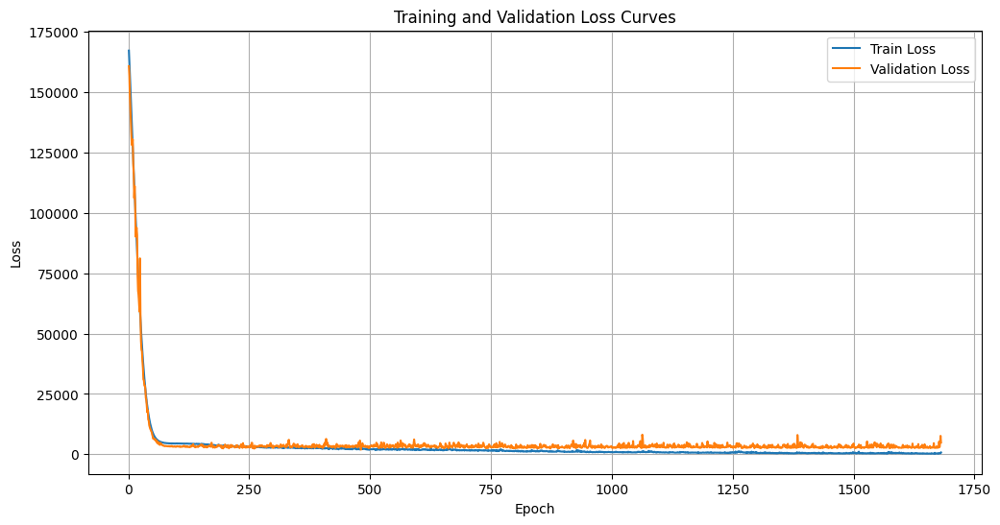

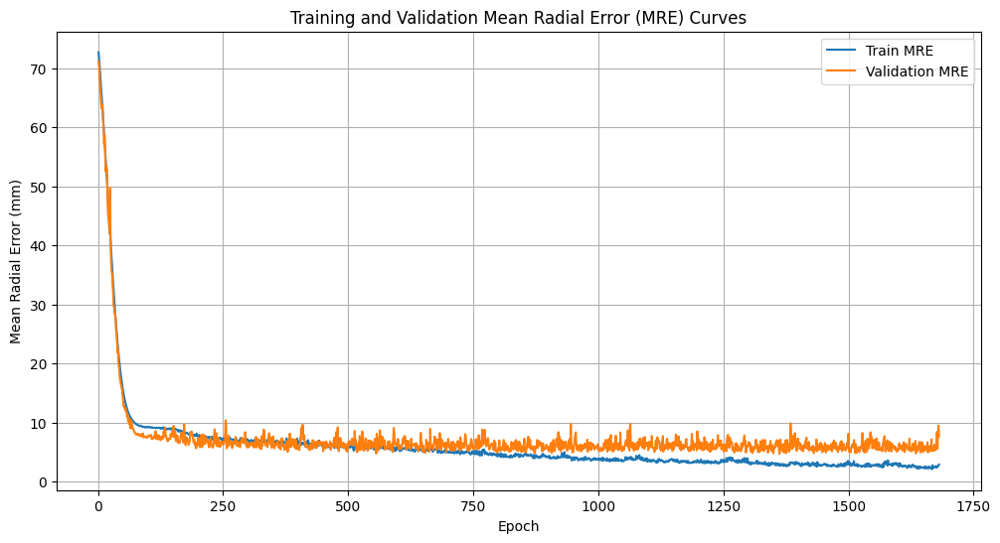

In [ ]:
import matplotlib.pyplot as plt

# Plotting the loss curves
plt.figure(figsize=(12, 6))
plt.plot(range(1, epoch + 2), train_losses, label='Train Loss')
plt.plot(range(1, epoch + 2), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Curves')
plt.legend()
plt.grid(True)
plt.show()

# Plotting the MRE curves
plt.figure(figsize=(12, 6))
plt.plot(results['epoch'], results['train_mre'], label='Train MRE')
plt.plot(results['epoch'], results['val_mre'], label='Validation MRE')
plt.xlabel('Epoch')
plt.ylabel('Mean Radial Error (mm)')
plt.title('Training and Validation Mean Radial Error (MRE) Curves')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
results_df

,epoch,train_loss,val_loss,train_mre,val_mre,mse,rmse,r2
0,1,167216.696875,160769.734375,72.663879,71.141380,160769.750000,400.961029,-195.595859
1,2,162734.968750,156807.750000,71.643628,70.212303,156807.750000,395.989594,-190.810358
2,3,157592.934375,148894.453125,70.463524,68.338921,148894.453125,385.868439,-181.101463
3,4,152404.693750,143370.406250,69.243365,66.965782,143370.406250,378.642853,-174.244184
4,5,147289.693750,137200.875000,68.017369,65.434685,137200.875000,370.406372,-166.617387
...,...,...,...,...,...,...,...,...
1676,1677,334.174210,5212.241699,2.594900,8.413741,5212.241699,72.195854,-0.558259
1677,1678,325.701447,2971.489502,2.538434,5.599443,2971.489502,54.511372,0.073401
1678,1679,551.616077,4543.767578,2.716863,8.081347,4543.767578,67.407471,-0.559013
1679,1680,370.506134,7617.294434,2.721111,9.517268,7617.294434,87.277115,-4.557899


In [ ]:
results_df.to_excel('result_df.xlsx', index = False)

In [ ]:
def prediksi_dan_visualisasikan(image_path, model_path):
    # Load model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)

    # Load state dict without conv1 layer if it exists
    state_dict = torch.load(model_path)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    hrnet.load_state_dict(state_dict, strict=False)

    # Create new first conv layer to accept a single-channel grayscale image
    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    hrnet.conv1 = new_first_conv_layer

    hrnet.to(device)
    hrnet.eval()

    # Load and preprocess image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))
    image = transform(image).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        outputs = hrnet(image)
        predicted_landmarks = outputs.view(-1, 32, 2).cpu().numpy()

    return predicted_landmarks

def evaluate_model(test_loader, model_path, pixel_per_mm):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)

    state_dict = torch.load(model_path)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    hrnet.load_state_dict(state_dict, strict=False)

    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    hrnet.conv1 = new_first_conv_layer

    hrnet.to(device)
    hrnet.eval()

    all_outputs = []
    all_targets = []
    with torch.no_grad():
        for images, landmarks in test_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            all_outputs.append(outputs.cpu().numpy())
            all_targets.append(landmarks.cpu().numpy())

    all_outputs = np.concatenate(all_outputs, axis=0).reshape(-1, 64)
    all_targets = np.concatenate(all_targets, axis=0).reshape(-1, 64)

    mse = mean_squared_error(all_targets, all_outputs)
    rmse = np.sqrt(mse)
    r2 = r2_score(all_targets, all_outputs)
    mre = mean_radial_error(torch.tensor(all_outputs), torch.tensor(all_targets), pixel_per_mm)

    # Simpan hasil ke dalam DataFrame
    df_results = pd.DataFrame({
        'MSE': [mse],
        'RMSE': [rmse],
        'R²': [r2],
        'MRE (mm)': [mre]
    })

    return df_results

# Data paths
model_path = '/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/best_model_w18.pth'
asli = pd.read_csv('/content/drive/MyDrive/TRYTRY/data_annot.csv')

# Evaluate the model
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
results_df_test = evaluate_model(test_loader, model_path, pixel_per_mm=7.8)
print('Evaluasi Data Test:')
results_df_test

Evaluasi Data Test:


,MSE,RMSE,R²,MRE (mm)
0,2584.817871,50.841103,-0.735155,7.111877


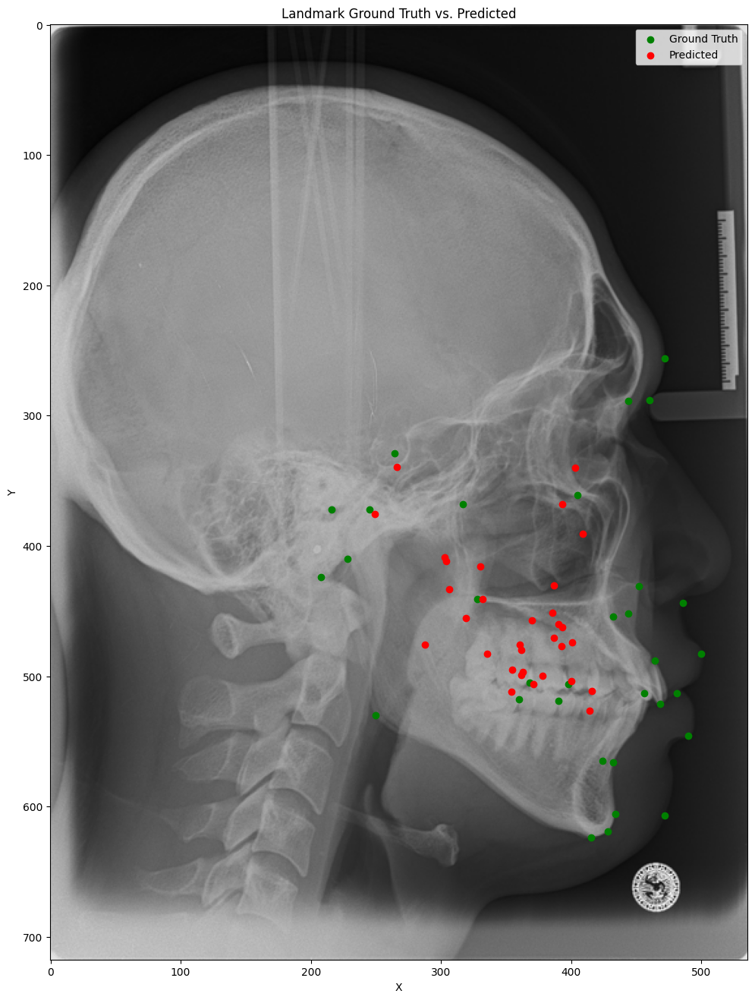

Mean Radial Error (MRE) in mm: 15.91


In [ ]:
# Visualize predictions
# Choose a random file_name from the test dataset
random_index = np.random.choice(len(test_dataset))
random_sample = test_dataset[random_index]
random_sample_index = test_dataset.indices[random_index]  # Get the original index

random_file_name = asli.iloc[random_sample_index]['file_name']
image_path = f'/content/drive/MyDrive/TRYTRY/data/images/{random_file_name}'

predicted_landmarks = prediksi_dan_visualisasikan(image_path, model_path)

# Filter asli for the random file_name
asli_1 = asli[asli['file_name'] == random_file_name]
landmark_columns = asli_1.columns[asli_1.columns.str.endswith(('_x', '_y'))]
x_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_x')]].values.flatten()
y_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_y')]].values.flatten()
x_coords_pred = predicted_landmarks[0][:, 0]
y_coords_pred = predicted_landmarks[0][:, 1]
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(12, 16))
ax.imshow(image)
ax.scatter(x_coords_true, y_coords_true, c='g', label='Ground Truth')
ax.scatter(x_coords_pred, y_coords_pred, c='r', label='Predicted')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Landmark Ground Truth vs. Predicted')
ax.legend()
plt.show()

df_true = pd.DataFrame({'x': x_coords_true, 'y': y_coords_true, 'label': 'Ground Truth'})
df_pred = pd.DataFrame({'x': x_coords_pred, 'y': y_coords_pred, 'label': 'Predicted'})
df_combined = pd.concat([df_true, df_pred])

chart = alt.Chart(df_combined).mark_circle(size=100).encode(
    x='x',
    y='y',
    color='label',
    tooltip=['x', 'y', 'label']
).properties(
    title='Landmark Ground Truth vs. Predicted',
    width=800,
    height=600
).interactive()

# Calculate Mean Radial Error (MRE) in millimeters
errors_mm = np.sqrt(((x_coords_true - x_coords_pred) / pixel_per_mm) ** 2 +
                    ((y_coords_true - y_coords_pred) / pixel_per_mm) ** 2)
mre_mm = np.mean(errors_mm)
print(f'Mean Radial Error (MRE) in mm: {mre_mm:.2f}')

#### train mre bisa

In [ ]:
# 4. Training and Evaluation
# Define criterion and optimizer
def mean_radial_error_loss(pred, target, pixel_per_mm):
    pred = pred.view(-1, 32, 2)
    target = target.view(-1, 32, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean()

optimizer = optim.Adam(hrnet.parameters(), lr=0.001, weight_decay=1e-5)

# Define training parameters
patience = 500
best_val_loss = float('inf')
epochs_without_improvement = 0
train_losses, val_losses = [], []
results = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "mse": [],
    "rmse": [],
    "r2": []
}
num_epochs = 2000
pixel_per_mm = 7.8

for epoch in range(num_epochs):
    hrnet.train()
    train_loss = 0.0
    for images, landmarks in train_loader:
        images = images.to(device)
        landmarks = landmarks.to(device)
        optimizer.zero_grad()

        images = images.squeeze(2)
        outputs = hrnet(images)
        loss = mean_radial_error_loss(outputs, landmarks, pixel_per_mm)
        loss.backward()  # Ini diperlukan untuk backpropagation
        optimizer.step()

        train_loss += loss.item() * images.size(0)

    train_loss /= len(train_loader.dataset)

    hrnet.eval()
    val_loss = 0.0
    all_outputs = []
    all_targets = []
    with torch.no_grad():
        for images, landmarks in val_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            loss =  mean_radial_error_loss(outputs, landmarks, pixel_per_mm)
            val_loss += loss.item() * images.size(0)

            all_outputs.append(outputs.cpu().numpy())
            all_targets.append(landmarks.cpu().numpy())

        val_loss /= len(val_loader.dataset)
        all_outputs = np.concatenate(all_outputs, axis=0).reshape(-1, 64)
        all_targets = np.concatenate(all_targets, axis=0).reshape(-1, 64)
        mse = mean_squared_error(all_targets, all_outputs)
        rmse = np.sqrt(mse)
        r2 = r2_score(all_targets, all_outputs)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

    results["epoch"].append(epoch + 1)
    results["train_loss"].append(train_loss)
    results["val_loss"].append(val_loss)
    results["mse"].append(mse)
    results["rmse"].append(rmse)
    results["r2"].append(r2)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        torch.save(hrnet.state_dict(), 'hrnetv2_pretrained/best_model_w18.pth')
    else:
        epochs_without_improvement += 1
        if epochs_without_improvement >= patience:
            print("Early stopping triggered!")
            break

# Save results to DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('training_results_mreloss.csv', index=False)

## Grid Search

In [33]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters grid
learning_rates = [0.001, 0.0001]
# optimizers = ['adam']
optimizers = ['adam', 'adamw', 'adamax']

# Function to create optimizer
def get_optimizer(optimizer_name, params, lr):
    if optimizer_name == 'adam':
        return optim.Adam(params, lr=lr, weight_decay=1e-5)
    elif optimizer_name == 'adamw':
        return optim.AdamW(params, lr=lr, weight_decay=1e-5)
    elif optimizer_name == 'adamax':
        return optim.Adamax(params, lr=lr, weight_decay=1e-5)

# Function to create and modify HRNet model
def create_hrnet_model():
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.load_state_dict(torch.load('hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                     kernel_size=first_conv_layer.kernel_size,
                                     stride=first_conv_layer.stride,
                                     padding=first_conv_layer.padding,
                                     bias=first_conv_layer.bias)

    hrnet.conv1 = new_first_conv_layer
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)
    hrnet.to(device)

    return hrnet

#### grid search mre bisa

In [34]:
# Variables to store the best results
best_val_loss = float('inf')
best_params = {'learning_rate': None, 'optimizer': None, 'val_loss': float('inf')}


# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

def mean_radial_error_loss(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean()  # Hapus .item() di sini

# Define a function to ensure all lists are the same length
def trim_lists_to_shortest(results):
    min_length = min(len(lst) for lst in results.values())
    for key in results:
        results[key] = results[key][:min_length]
    return results

# Training and evaluation loop
for lr in learning_rates:
    for opt in optimizers:
        print(f"Training with learning rate: {lr}, optimizer: {opt}")

        # Create model and optimizer
        hrnet = create_hrnet_model()
        optimizer = get_optimizer(opt, hrnet.parameters(), lr)

        # Define criterion and other parameters
        # criterion = nn.MSELoss()
        patience = 700
        best_combination_val_loss = float('inf')
        epochs_without_improvement = 0
        train_losses, val_losses = [], []
        results = {
            "epoch": [],
            "train_loss": [],
            "val_loss": [],
            "mse": [],
            "rmse": [],
            "r2": []
        }
        num_epochs = 2000
        pixel_per_mm = 7.8

        for epoch in range(num_epochs):
            hrnet.train()
            train_loss = 0.0
            for images, landmarks in train_loader:
                images = images.to(device)
                landmarks = landmarks.to(device)
                optimizer.zero_grad()

                images = images.squeeze(2)
                outputs = hrnet(images)
                loss = mean_radial_error_loss(outputs, landmarks, pixel_per_mm)
                loss.backward()  # Ini diperlukan untuk backpropagation
                optimizer.step()

                train_loss += loss.item() * images.size(0)

            train_loss /= len(train_loader.dataset)

            hrnet.eval()
            val_loss = 0.0
            val_mre = 0.0
            all_outputs = []
            all_targets = []
            with torch.no_grad():
                for images, landmarks in val_loader:
                    images = images.to(device)
                    landmarks = landmarks.to(device)
                    images = images.squeeze(2)
                    outputs = hrnet(images)
                    loss =  mean_radial_error_loss(outputs, landmarks, pixel_per_mm)
                    val_loss += loss.item() * images.size(0)

                    all_outputs.append(outputs.cpu().numpy())
                    all_targets.append(landmarks.cpu().numpy())

                val_loss /= len(val_loader.dataset)
                all_outputs = np.concatenate(all_outputs, axis=0).reshape(-1, 64)
                all_targets = np.concatenate(all_targets, axis=0).reshape(-1, 64)
                mse = mean_squared_error(all_targets, all_outputs)
                rmse = np.sqrt(mse)
                r2 = r2_score(all_targets, all_outputs)

            train_losses.append(train_loss)
            val_losses.append(val_loss)
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

            results["epoch"].append(epoch + 1)
            results["train_loss"].append(train_loss)
            results["val_loss"].append(val_loss)
            results["mse"].append(mse)
            results["rmse"].append(rmse)
            results["r2"].append(r2)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_params['learning_rate'] = lr
                best_params['optimizer'] = opt
                best_params['val_loss'] = val_loss
                torch.save(hrnet.state_dict(), f'hrnetv2_pretrained/best_model_mre_{lr}_{opt}.pth')
                epochs_without_improvement = 0
            else:
                epochs_without_improvement += 1
                if epochs_without_improvement >= patience:
                    print("Early stopping triggered!")
                    break

        # Check if this combination is the best so far
        if val_loss < best_val_loss:  # Use the correct variable to compare
            best_params["learning_rate"] = lr
            best_params["optimizer"] = opt
            best_val_loss = val_loss  # Update the best validation loss


        # print(f"Results before trimming: {results}")
        results = trim_lists_to_shortest(results)
        # print(f"Results after trimming: {results}")

        results_df = pd.DataFrame(results)
        print(f"Dataframe shape: {results_df.shape}")

        if results_df.empty:
            print("Dataframe is empty. No data to save.")
        else:
            results_df.to_csv(f'training_results_mre_{lr}_{opt}.csv', index=False)
            print(f"Results saved to training_results_mre_{lr}_{opt}.csv")


print(f"Best hyperparameters: Learning Rate = {best_params['learning_rate']}, Optimizer = {best_params['optimizer']}")

Training with learning rate: 0.001, optimizer: adam
Epoch [1/2000], Train Loss: 72.3746, Validation Loss: 74.1883, MSE: 173846.2500, RMSE: 416.9487, R²: -96.8979
Epoch [2/2000], Train Loss: 71.3463, Validation Loss: 71.3888, MSE: 161386.0000, RMSE: 401.7288, R²: -90.1234
Epoch [3/2000], Train Loss: 70.1518, Validation Loss: 69.9533, MSE: 155192.0312, RMSE: 393.9442, R²: -86.7559
Epoch [4/2000], Train Loss: 68.9425, Validation Loss: 68.3807, MSE: 148569.1406, RMSE: 385.4467, R²: -83.1476
Epoch [5/2000], Train Loss: 67.7002, Validation Loss: 67.5022, MSE: 144920.9062, RMSE: 380.6848, R²: -81.1630
Epoch [6/2000], Train Loss: 66.4388, Validation Loss: 66.7616, MSE: 141941.8281, RMSE: 376.7517, R²: -79.5135
Epoch [7/2000], Train Loss: 65.1292, Validation Loss: 66.4941, MSE: 140788.3125, RMSE: 375.2177, R²: -78.8954
Epoch [8/2000], Train Loss: 63.8106, Validation Loss: 64.5042, MSE: 132895.8125, RMSE: 364.5488, R²: -74.5545
Epoch [9/2000], Train Loss: 62.4661, Validation Loss: 63.3055, MSE: 

#### visualisasi

In [36]:
print(best_params)

{'learning_rate': 0.001, 'optimizer': 'adamax', 'val_loss': 5.959289073944092}


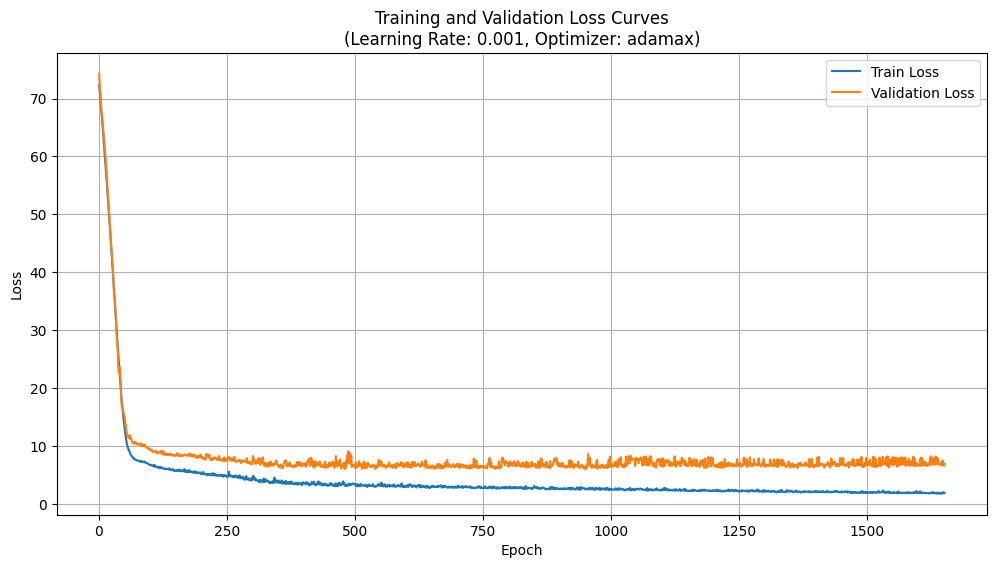

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the results of the best parameters
best_lr = best_params['learning_rate']
best_opt = best_params['optimizer']
results_df = pd.read_csv(f'training_results_mre_{best_lr}_{best_opt}.csv')

# Extract data for plotting
epochs = results_df['epoch']
train_losses = results_df['train_loss']
val_losses = results_df['val_loss']
# train_mre = results_df['train_mre']
# val_mre = results_df['val_mre']

# Plotting the loss curves
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title(f'Training and Validation Loss Curves\n(Learning Rate: {best_lr}, Optimizer: {best_opt})')
plt.legend()
plt.grid(True)
plt.show()

# # Plotting the MRE curves
# plt.figure(figsize=(12, 6))
# plt.plot(epochs, train_mre, label='Train MRE')
# plt.plot(epochs, val_mre, label='Validation MRE')
# plt.xlabel('Epoch')
# plt.ylabel('Mean Radial Error (mm)')
# plt.title(f'Training and Validation Mean Radial Error (MRE) Curves\n(Learning Rate: {best_lr}, Optimizer: {best_opt})')
# plt.legend()
# plt.grid(True)
# plt.show()



In [56]:
def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 32, 2)
    target = target.view(-1, 32, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

def prediksi_dan_visualisasikan(image_path, model_path):
    # Load model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)

    # Load state dict without conv1 layer if it exists
    state_dict = torch.load(model_path)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    hrnet.load_state_dict(state_dict, strict=False)

    # Create new first conv layer to accept a single-channel grayscale image
    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    hrnet.conv1 = new_first_conv_layer

    hrnet.to(device)
    hrnet.eval()

    # Load and preprocess image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))
    image = transform(image).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        outputs = hrnet(image)
        predicted_landmarks = outputs.view(-1, 32, 2).cpu().numpy()

    return predicted_landmarks

def evaluate_model(test_loader, model_path, pixel_per_mm):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)

    state_dict = torch.load(model_path)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    hrnet.load_state_dict(state_dict, strict=False)

    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    hrnet.conv1 = new_first_conv_layer

    hrnet.to(device)
    hrnet.eval()

    all_outputs = []
    all_targets = []
    with torch.no_grad():
        for images, landmarks in test_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            all_outputs.append(outputs.cpu().numpy())
            all_targets.append(landmarks.cpu().numpy())

    all_outputs = np.concatenate(all_outputs, axis=0).reshape(-1, 64)
    all_targets = np.concatenate(all_targets, axis=0).reshape(-1, 64)

    mse = mean_squared_error(all_targets, all_outputs)
    rmse = np.sqrt(mse)
    r2 = r2_score(all_targets, all_outputs)
    mre = mean_radial_error(torch.tensor(all_outputs), torch.tensor(all_targets), pixel_per_mm)

    # Simpan hasil ke dalam DataFrame
    df_results = pd.DataFrame({
        'MSE': [mse],
        'RMSE': [rmse],
        'R²': [r2],
        'MRE (mm)': [mre]
    })

    return df_results

# Data paths
model_path = 'hrnetv2_pretrained/best_model_mre_0.001_adamax.pth'
asli = pd.read_csv('data_annot.csv')

# Evaluate the model
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
results_df_test = evaluate_model(test_loader, model_path, pixel_per_mm=7.8)
print('Evaluasi Data Test:')
results_df_test

Evaluasi Data Test:


,MSE,RMSE,R²,MRE (mm)
0,2439.384766,49.390129,0.421157,4.03173


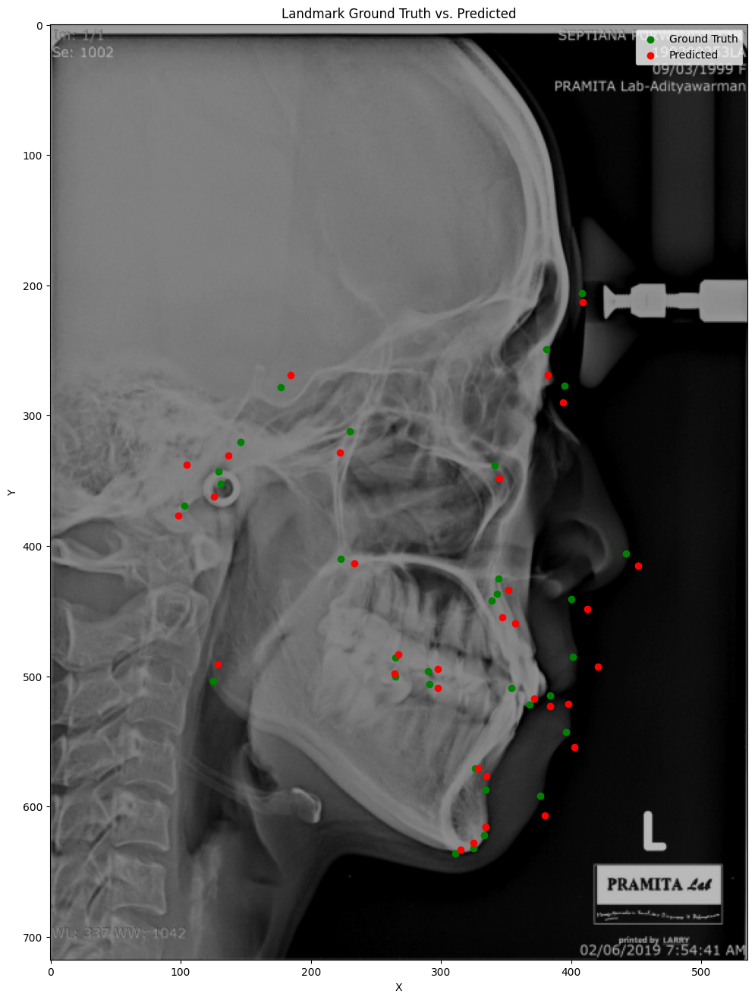

Mean Radial Error (MRE) in mm: 1.58


In [41]:
# Visualize predictions
# Choose a random file_name from the test dataset
random_index = np.random.choice(len(test_dataset))
random_sample = test_dataset[random_index]
random_sample_index = test_dataset.indices[random_index]  # Get the original index

random_file_name = asli.iloc[random_sample_index]['file_name']
image_path = f'data/images/{random_file_name}'

predicted_landmarks = prediksi_dan_visualisasikan(image_path, model_path)

# Filter asli for the random file_name
asli_1 = asli[asli['file_name'] == random_file_name]
landmark_columns = asli_1.columns[asli_1.columns.str.endswith(('_x', '_y'))]
x_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_x')]].values.flatten()
y_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_y')]].values.flatten()
x_coords_pred = predicted_landmarks[0][:, 0]
y_coords_pred = predicted_landmarks[0][:, 1]
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(12, 16))
ax.imshow(image)
ax.scatter(x_coords_true, y_coords_true, c='g', label='Ground Truth')
ax.scatter(x_coords_pred, y_coords_pred, c='r', label='Predicted')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Landmark Ground Truth vs. Predicted')
ax.legend()
plt.show()

df_true = pd.DataFrame({'x': x_coords_true, 'y': y_coords_true, 'label': 'Ground Truth'})
df_pred = pd.DataFrame({'x': x_coords_pred, 'y': y_coords_pred, 'label': 'Predicted'})
df_combined = pd.concat([df_true, df_pred])

chart = alt.Chart(df_combined).mark_circle(size=100).encode(
    x='x',
    y='y',
    color='label',
    tooltip=['x', 'y', 'label']
).properties(
    title='Landmark Ground Truth vs. Predicted',
    width=800,
    height=600
).interactive()

# Calculate Mean Radial Error (MRE) in millimeters
errors_mm = np.sqrt(((x_coords_true - x_coords_pred) / pixel_per_mm) ** 2 +
                    ((y_coords_true - y_coords_pred) / pixel_per_mm) ** 2)
mre_mm = np.mean(errors_mm)
print(f'Mean Radial Error (MRE) in mm: {mre_mm:.2f}')

# Prediksi Per Titik

## Coba 1 Titik

In [ ]:
def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

In [ ]:
# 3. Model (HRNet)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
hrnet = create_model('hrnet_w18', pretrained=False)
hrnet.load_state_dict(torch.load('hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

# Modify the first convolutional layer to expect 1 input channel
first_conv_layer = hrnet.conv1
new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding,
                                 bias=first_conv_layer.bias is not None)
hrnet.conv1 = new_first_conv_layer
hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 1 * 2)
hrnet.to(device)

# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

# Optimizer
optimizer = optim.Adam(hrnet.parameters(), lr=0.001)

def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

# Training parameters
patience = 500
pixel_per_mm = 7.8
best_val_loss = [float('inf')] * 1
epochs_without_improvement = [0] * 1
train_losses, val_losses = [[] for _ in range(1)], [[] for _ in range(1)]
train_mre, val_mre = [[] for _ in range(1)], [[] for _ in range(1)]
results = {
    "epoch": [],
    "train_loss": [[] for _ in range(1)],
    "val_loss": [[] for _ in range(1)],
    "train_mre": [[] for _ in range(1)],
    "val_mre": [[] for _ in range(1)],
    "mse": [[] for _ in range(1)],
    "rmse": [[] for _ in range(1)],
    "r2": [[] for _ in range(1)]
}
num_epochs = 1000

for epoch in range(num_epochs):
    hrnet.train()
    epoch_train_loss = [0.0] * 1
    epoch_train_mre = [0.0] * 1
    for images, landmarks in train_loader:
        images = images.to(device)
        landmarks = landmarks.to(device)
        optimizer.zero_grad()
        images = images.squeeze(2)
        outputs = hrnet(images)
        outputs = outputs.view(-1, 1, 2)
        for i in range(1):
            loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
            loss.backward(retain_graph=True if i < 2 else False)
            epoch_train_loss[i] += loss.item() * images.size(0)
            epoch_train_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
        optimizer.step()

    epoch_train_loss = [loss / len(train_loader.dataset) for loss in epoch_train_loss]
    epoch_train_mre = [mre / len(train_loader.dataset) for mre in epoch_train_mre]
    for i in range(1):
        train_losses[i].append(epoch_train_loss[i])
        train_mre[i].append(epoch_train_mre[i])

    hrnet.eval()
    epoch_val_loss = [0.0] * 1
    epoch_val_mre = [0.0] * 1
    all_outputs, all_targets = [[] for _ in range(1)], [[] for _ in range(1)]
    with torch.no_grad():
        for images, landmarks in val_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            outputs = outputs.view(-1, 1, 2)
            for i in range(1):
                loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
                epoch_val_loss[i] += loss.item() * images.size(0)
                epoch_val_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
                all_outputs[i].append(outputs[:, i].cpu().numpy())
                all_targets[i].append(landmarks[:, i].cpu().numpy())

    epoch_val_loss = [loss / len(val_loader.dataset) for loss in epoch_val_loss]
    epoch_val_mre = [mre / len(val_loader.dataset) for mre in epoch_val_mre]
    for i in range(1):
        val_losses[i].append(epoch_val_loss[i])
        val_mre[i].append(epoch_val_mre[i])
        all_outputs[i] = np.concatenate(all_outputs[i], axis=0)
        all_targets[i] = np.concatenate(all_targets[i], axis=0)
        mse = mean_squared_error(all_targets[i], all_outputs[i])
        rmse = np.sqrt(mse)
        r2 = r2_score(all_targets[i], all_outputs[i])

        results["train_loss"][i].append(epoch_train_loss[i])
        results["val_loss"][i].append(epoch_val_loss[i])
        results["train_mre"][i].append(epoch_train_mre[i])
        results["val_mre"][i].append(epoch_val_mre[i])
        results["mse"][i].append(mse)
        results["rmse"][i].append(rmse)
        results["r2"][i].append(r2)

        # Print progress for each point
        print(f"Epoch [{epoch+1}/{num_epochs}] - Point {i+1}: Train Loss = {epoch_train_loss[i]:.4f}, Val Loss = {epoch_val_loss[i]:.4f}, RMSE = {rmse:.4f}, MSE = {mse:.4f}, R² = {r2:.4f}, Train MRE = {epoch_train_mre[i]:.4f}, Val MRE = {epoch_val_mre[i]:.4f}")

        if epoch_val_loss[i] < best_val_loss[i]:
            best_val_loss[i] = epoch_val_loss[i]
            epochs_without_improvement[i] = 0
            torch.save(hrnet.state_dict(), f'/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/tiap_titik_5/best_model_point_1_{i+1}.pth')
        else:
            epochs_without_improvement[i] += 1
            if epochs_without_improvement[i] >= patience:
                print(f"Early stopping triggered for point {i+1}!")
                break

    results["epoch"].append(epoch + 1)
    print(f"Epoch [{epoch+1}/{num_epochs}] completed.")



/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [1/1000] - Point 1: Train Loss = 481.0833, Val Loss = 463.6847, RMSE = 463.6847, MSE = 215003.4688, R² = -57.4115, Train MRE = 86.7283, Val MRE = 83.1048
Epoch [1/1000] completed.
Epoch [2/1000] - Point 1: Train Loss = 474.8852, Val Loss = 447.2564, RMSE = 447.2564, MSE = 200038.3125, R² = -54.2100, Train MRE = 85.6057, Val MRE = 80.1348
Epoch [2/1000] completed.
Epoch [3/1000] - Point 1: Train Loss = 469.1875, Val Loss = 453.3723, RMSE = 453.3723, MSE = 205546.4062, R² = -53.4830, Train MRE = 84.5300, Val MRE = 81.2118
Epoch [3/1000] completed.
Epoch [4/1000] - Point 1: Train Loss = 462.7327, Val Loss = 447.6980, RMSE = 447.6980, MSE = 200433.5312, R² = -51.6236, Train MRE = 83.3760, Val MRE = 80.1424
Epoch [4/1000] completed.
Epoch [5/1000] - Point 1: Train Loss = 456.3913, Val Loss = 437.0520, RMSE = 437.0520, MSE = 191014.4375, R² = -48.6549, Train MRE = 82.1908, Val MRE = 78.1997
Epoch [5/1000] completed.
Epoch [6/1000] - Point 1: Train Loss = 449.5200, Val Loss = 425.7928, 

ValueError: All arrays must be of the same length

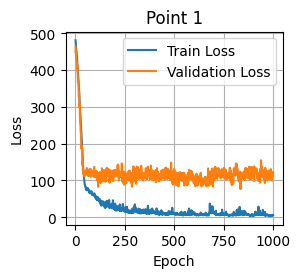

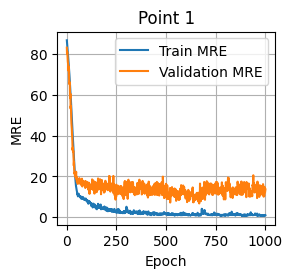

In [ ]:
# Plotting the loss curves for each point
plt.figure(figsize=(20, 10))
for i in range(1):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_losses[i], label='Train Loss')
    plt.plot(range(1, epoch + 2), val_losses[i], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting the MRE curves for each point
plt.figure(figsize=(20, 10))
for i in range(1):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_mre[i], label='Train MRE')
    plt.plot(range(1, epoch + 2), val_mre[i], label='Validation MRE')
    plt.xlabel('Epoch')
    plt.ylabel('MRE')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

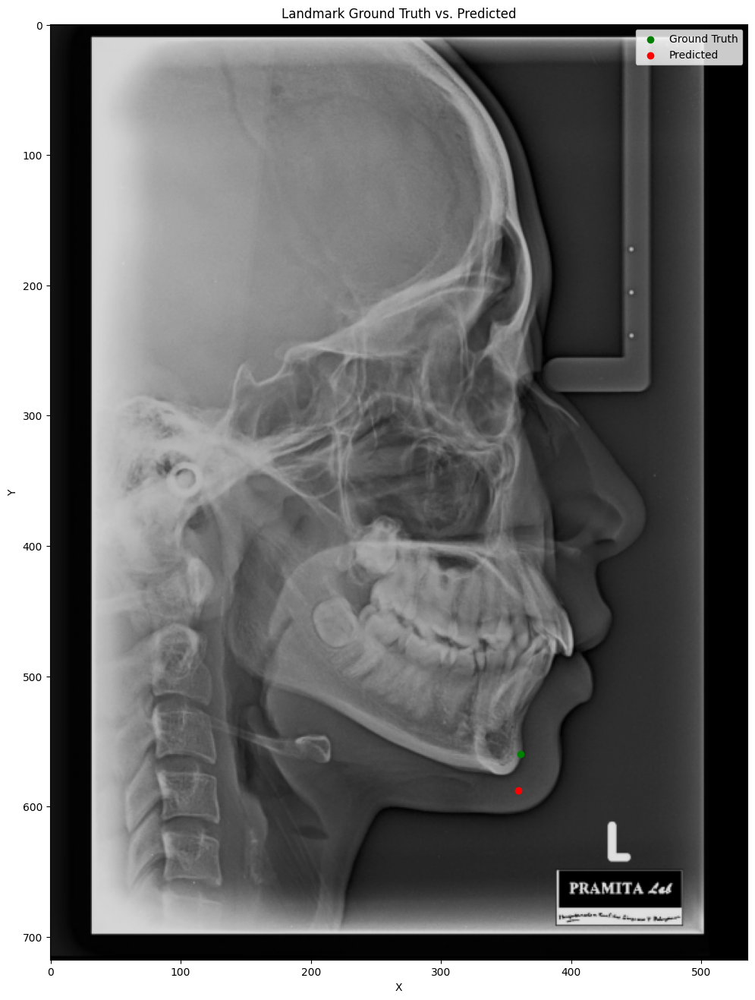

Mean Radial Error (MRE) in mm: 3.53


In [ ]:
# Visualize predictions
# Specify the landmark index (0-based) to load the trained model for
landmark_idx = 0
asli = pd.read_csv('/content/drive/MyDrive/TRYTRY/data_annot.csv')
model_path = f'/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/tiap_titik_5/best_model_point_1_{landmark_idx+1}.pth'
# Function to load the model and make predictions
def prediksi_dan_visualisasikan(image_path, model_path):
    # Load the model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    pixel_per_mm = 7.8
    model = create_model('hrnet_w18', pretrained=False)
    model.classifier = nn.Linear(model.classifier.in_features, 1 * 2)

    state_dict = torch.load(model_path, map_location=device)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    model.load_state_dict(state_dict, strict=False)

    first_conv_layer = model.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    model.conv1 = new_first_conv_layer

    model.to(device)
    model.eval()

    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))
    image = image / 255.0  # Normalize the image
    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

    # Make predictions
    with torch.no_grad():
        outputs = model(image)
        outputs = outputs.view(-1, 1, 2).cpu().numpy()

    return outputs

# Choose a random file_name from the test dataset
random_index = np.random.choice(len(test_dataset))
random_sample = test_dataset[random_index]
random_sample_index = test_dataset.indices[random_index]  # Get the original index

random_file_name = asli.iloc[random_sample_index]['file_name']
image_path = f'/content/drive/MyDrive/TRYTRY/data/images/{random_file_name}'

predicted_landmarks = prediksi_dan_visualisasikan(image_path, model_path)

# Filter asli for the random file_name
asli_1 = asli[asli['file_name'] == random_file_name]
landmark_columns = asli_1.columns[asli_1.columns.str.endswith(('_x', '_y'))]
x_coords_true = asli_1[f'{landmark_columns[landmark_idx*2]}'].values.flatten()
y_coords_true = asli_1[f'{landmark_columns[landmark_idx*2 + 1]}'].values.flatten()
x_coords_pred = predicted_landmarks[0][:, 0]
y_coords_pred = predicted_landmarks[0][:, 1]
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(12, 16))
ax.imshow(image)
ax.scatter(x_coords_true, y_coords_true, c='g', label='Ground Truth')
ax.scatter(x_coords_pred, y_coords_pred, c='r', label='Predicted')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Landmark Ground Truth vs. Predicted')
ax.legend()
plt.show()

df_true = pd.DataFrame({'x': x_coords_true, 'y': y_coords_true, 'label': 'Ground Truth'})
df_pred = pd.DataFrame({'x': x_coords_pred, 'y': y_coords_pred, 'label': 'Predicted'})
df_combined = pd.concat([df_true, df_pred])

chart = alt.Chart(df_combined).mark_circle(size=100).encode(
    x='x',
    y='y',
    color='label',
    tooltip=['x', 'y', 'label']
).properties(
    title='Landmark Ground Truth vs. Predicted',
    width=800,
    height=600
).interactive()

# Calculate Mean Radial Error (MRE) in millimeters
errors_mm = np.sqrt(((x_coords_true - x_coords_pred) / pixel_per_mm) ** 2 +
                    ((y_coords_true - y_coords_pred) / pixel_per_mm) ** 2)
mre_mm = np.mean(errors_mm)
print(f'Mean Radial Error (MRE) in mm: {mre_mm:.2f}')

In [ ]:
random_sample_index

92

In [ ]:
test_dataset

Test Point 1: Test Loss = 92.5593, Test MRE = 9.6031


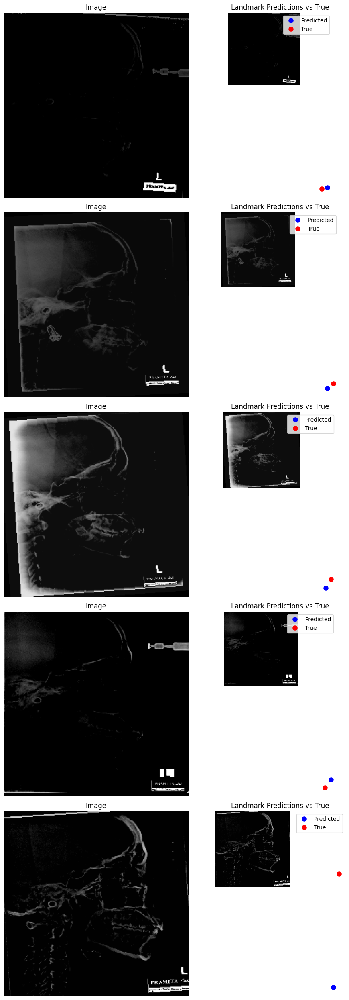

In [ ]:
def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

# Specify the landmark index (0-based) to load the trained model for
landmark_idx = 0  # Change this to evaluate a different landmark

# Load the best model for the specified landmark
best_model_path = f'/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/tiap_titik_5/best_model_point_1_{landmark_idx+1}.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = create_model('hrnet_w18', pretrained=False)
model.classifier = nn.Linear(model.classifier.in_features, 1 * 2)

state_dict = torch.load(best_model_path, map_location=torch.device('cpu'))
if 'conv1.weight' in state_dict:
    state_dict.pop('conv1.weight')
if 'conv1.bias' in state_dict:
    state_dict.pop('conv1.bias')
model.load_state_dict(state_dict, strict=False)

first_conv_layer = model.conv1
new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                            kernel_size=first_conv_layer.kernel_size,
                            stride=first_conv_layer.stride,
                            padding=first_conv_layer.padding,
                            bias=first_conv_layer.bias is not None)
model.conv1 = new_first_conv_layer

model.to(device)
model.eval()

# Define function to evaluate test data for the specific landmark
def evaluate_test_data(model, test_loader, landmark_idx):
    model.eval()
    test_loss = 0.0
    test_mre = 0.0
    all_test_outputs, all_test_targets = [], []

    with torch.no_grad():
        for images, landmarks in test_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = model(images)
            outputs = outputs.view(-1, 1, 2)
            outputs = outputs[:, landmark_idx, :]

            loss = root_mean_squared_error(outputs, landmarks[:, landmark_idx, :])
            test_loss += loss.item() * images.size(0)
            test_mre += mean_radial_error(outputs, landmarks[:, landmark_idx, :], pixel_per_mm) * images.size(0)
            all_test_outputs.append(outputs.cpu().numpy())
            all_test_targets.append(landmarks[:, landmark_idx, :].cpu().numpy())

    test_loss /= len(test_loader.dataset)
    test_mre /= len(test_loader.dataset)
    all_test_outputs = np.concatenate(all_test_outputs, axis=0)
    all_test_targets = np.concatenate(all_test_targets, axis=0)

    return test_loss, test_mre, all_test_outputs, all_test_targets

# Evaluate test data for the specific landmark
pixel_per_mm = 7.8  # Example value, change to your specific value
test_loss, test_mre, test_outputs, test_targets = evaluate_test_data(model, test_loader, landmark_idx)

# Print test results
print(f"Test Point {landmark_idx+1}: Test MRE = {test_mre:.4f}")

# Visualize predictions on test data (example)
def visualize_predictions(images, predicted_landmarks, true_landmarks, num_samples=5):
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    for i in range(num_samples):
        image = images[i].cpu().numpy().squeeze()
        predicted = predicted_landmarks[i]
        true = true_landmarks[i]

        axs[i, 0].imshow(image, cmap='gray')
        axs[i, 0].set_title('Image')
        axs[i, 0].axis('off')

        axs[i, 1].imshow(image, cmap='gray')
        axs[i, 1].plot(predicted[0], predicted[1], 'bo', label='Predicted', markersize=8)
        axs[i, 1].plot(true[0], true[1], 'ro', label='True', markersize=8)
        axs[i, 1].set_title('Landmark Predictions vs True')
        axs[i, 1].legend()
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example: Visualize predictions on a batch of test data
images, landmarks = next(iter(test_loader))
images = images.to(device)
landmarks = landmarks.to(device)
images = images.squeeze(2)

# Get predictions
outputs = model(images)
outputs = outputs.view(-1, 1, 2)
predicted_landmarks = outputs[:, landmark_idx, :].detach().cpu().numpy()

# Reshape predicted_landmarks to be 2D
predicted_landmarks = predicted_landmarks.reshape(-1, 2)

# Reshape landmarks for visualization
landmarks_reshaped = landmarks[:, landmark_idx, :].cpu().numpy().reshape(-1, 2)

# Visualize
visualize_predictions(images, predicted_landmarks, landmarks_reshaped)


### Grid Search

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define hyperparameters
learning_rates = [0.001, 0.0001]
optimizers = ['adam', 'adamw', 'adamax']

# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

# Training parameters
patience = 500
pixel_per_mm = 7.8
num_epochs = 2000

# Track the best hyperparameters
best_combination = {
    "learning_rate": None,
    "optimizer": None,
    "val_loss": float('inf')
}

# Store the results
results_dict = {}

# Loop over hyperparameter combinations
for lr in learning_rates:
    for opt in optimizers:
        # Initialize model
        hrnet = create_model('hrnet_w18', pretrained=False)
        hrnet.load_state_dict(torch.load('hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

        # Modify the first convolutional layer to expect 1 input channel
        first_conv_layer = hrnet.conv1
        new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                         kernel_size=first_conv_layer.kernel_size,
                                         stride=first_conv_layer.stride,
                                         padding=first_conv_layer.padding,
                                         bias=first_conv_layer.bias is not None)
        hrnet.conv1 = new_first_conv_layer
        hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 1 * 2)
        hrnet.to(device)

        # Define optimizer
        if opt == 'adam':
            optimizer = optim.Adam(hrnet.parameters(), lr=lr)
        elif opt == 'adamw':
            optimizer = optim.AdamW(hrnet.parameters(), lr=lr)
        elif opt == 'adamax':
            optimizer = optim.Adamax(hrnet.parameters(), lr=lr)

        best_val_loss = [float('inf')] * 1
        epochs_without_improvement = [0] * 1
        train_losses, val_losses = [[] for _ in range(1)], [[] for _ in range(1)]
        train_mre, val_mre = [[] for _ in range(1)], [[] for _ in range(1)]
        results = {
            "epoch": [],
            "train_loss": [[] for _ in range(1)],
            "val_loss": [[] for _ in range(1)],
            "train_mre": [[] for _ in range(1)],
            "val_mre": [[] for _ in range(1)],
            "mse": [[] for _ in range(1)],
            "rmse": [[] for _ in range(1)],
            "r2": [[] for _ in range(1)]
        }

        for epoch in range(num_epochs):
            hrnet.train()
            epoch_train_loss = [0.0] * 1
            epoch_train_mre = [0.0] * 1
            for images, landmarks in train_loader:
                images = images.to(device)
                landmarks = landmarks.to(device)
                optimizer.zero_grad()
                images = images.squeeze(2)
                outputs = hrnet(images)
                outputs = outputs.view(-1, 1, 2)
                for i in range(1):
                    loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
                    loss.backward(retain_graph=True if i < 2 else False)
                    epoch_train_loss[i] += loss.item() * images.size(0)
                    epoch_train_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
                optimizer.step()

            epoch_train_loss = [loss / len(train_loader.dataset) for loss in epoch_train_loss]
            epoch_train_mre = [mre / len(train_loader.dataset) for mre in epoch_train_mre]
            for i in range(1):
                train_losses[i].append(epoch_train_loss[i])
                train_mre[i].append(epoch_train_mre[i])

            hrnet.eval()
            epoch_val_loss = [0.0] * 1
            epoch_val_mre = [0.0] * 1
            all_outputs, all_targets = [[] for _ in range(1)], [[] for _ in range(1)]
            with torch.no_grad():
                for images, landmarks in val_loader:
                    images = images.to(device)
                    landmarks = landmarks.to(device)
                    images = images.squeeze(2)
                    outputs = hrnet(images)
                    outputs = outputs.view(-1, 1, 2)
                    for i in range(1):
                        loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
                        epoch_val_loss[i] += loss.item() * images.size(0)
                        epoch_val_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
                        all_outputs[i].append(outputs[:, i].cpu().numpy())
                        all_targets[i].append(landmarks[:, i].cpu().numpy())

            epoch_val_loss = [loss / len(val_loader.dataset) for loss in epoch_val_loss]
            epoch_val_mre = [mre / len(val_loader.dataset) for mre in epoch_val_mre]
            for i in range(1):
                val_losses[i].append(epoch_val_loss[i])
                val_mre[i].append(epoch_val_mre[i])
                all_outputs[i] = np.concatenate(all_outputs[i], axis=0)
                all_targets[i] = np.concatenate(all_targets[i], axis=0)
                mse = mean_squared_error(all_targets[i], all_outputs[i])
                rmse = np.sqrt(mse)
                r2 = r2_score(all_targets[i], all_outputs[i])

                results["train_loss"][i].append(epoch_train_loss[i])
                results["val_loss"][i].append(epoch_val_loss[i])
                results["train_mre"][i].append(epoch_train_mre[i])
                results["val_mre"][i].append(epoch_val_mre[i])
                results["mse"][i].append(mse)
                results["rmse"][i].append(rmse)
                results["r2"][i].append(r2)

                # Print progress for each point
                print(f"Epoch [{epoch+1}/{num_epochs}] - Point {i+1} - LR {lr} - Optimizer {opt}: Train Loss = {epoch_train_loss[i]:.4f}, Val Loss = {epoch_val_loss[i]:.4f}, RMSE = {rmse:.4f}, MSE = {mse:.4f}, R² = {r2:.4f}, Train MRE = {epoch_train_mre[i]:.4f}, Val MRE = {epoch_val_mre[i]:.4f}")

                if epoch_val_loss[i] < best_val_loss[i]:
                    best_val_loss[i] = epoch_val_loss[i]
                    epochs_without_improvement[i] = 0
                    torch.save(hrnet.state_dict(), f'hrnetv2_pretrained/tiap_titik_5/best_model_lr_{lr}_opt_{opt}_point_{i+1}.pth')
                else:
                    epochs_without_improvement[i] += 1
                    if epochs_without_improvement[i] >= patience:
                        print(f"Early stopping triggered for point {i+1} with LR {lr} and Optimizer {opt}!")
                        break

            # Update best combination if current one is better
            if best_val_loss[0] < best_combination["val_loss"]:
                best_combination["learning_rate"] = lr
                best_combination["optimizer"] = opt
                best_combination["val_loss"] = best_val_loss[0]

            results["epoch"].append(epoch + 1)
            print(f"Epoch [{epoch+1}/{num_epochs}] with LR {lr} and Optimizer {opt} completed.")

        # Store results for this combination
        results_dict[f'lr_{lr}_opt_{opt}'] = {
            "train_losses": train_losses[0],
            "val_losses": val_losses[0],
            "train_mre": train_mre[0],
            "val_mre": val_mre[0]
        }

# After all combinations
print("Grid search completed.")
print(f"Best combination: Learning Rate = {best_combination['learning_rate']}, Optimizer = {best_combination['optimizer']}, Validation Loss = {best_combination['val_loss']:.4f}")


Epoch [1/2000] - Point 1 - LR 0.001 - Optimizer adam: Train Loss = 481.6446, Val Loss = 465.3815, RMSE = 465.3815, MSE = 216579.9062, R² = -58.0528, Train MRE = 86.7888, Val MRE = 83.4207
Epoch [1/2000] with LR 0.001 and Optimizer adam completed.
Epoch [2/2000] - Point 1 - LR 0.001 - Optimizer adam: Train Loss = 475.3420, Val Loss = 457.1443, RMSE = 457.1443, MSE = 208980.9375, R² = -54.4173, Train MRE = 85.6584, Val MRE = 81.8587
Epoch [2/2000] with LR 0.001 and Optimizer adam completed.
Epoch [3/2000] - Point 1 - LR 0.001 - Optimizer adam: Train Loss = 469.6035, Val Loss = 446.1471, RMSE = 446.1471, MSE = 199047.2656, R² = -51.3738, Train MRE = 84.5982, Val MRE = 79.8295
Epoch [3/2000] with LR 0.001 and Optimizer adam completed.
Epoch [4/2000] - Point 1 - LR 0.001 - Optimizer adam: Train Loss = 463.4650, Val Loss = 439.1257, RMSE = 439.1257, MSE = 192831.4062, R² = -49.5419, Train MRE = 83.4773, Val MRE = 78.5760
Epoch [4/2000] with LR 0.001 and Optimizer adam completed.
Epoch [5/200

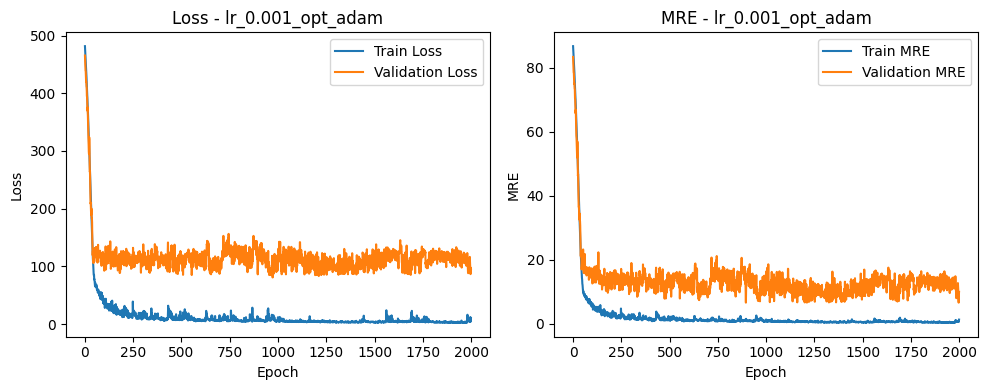

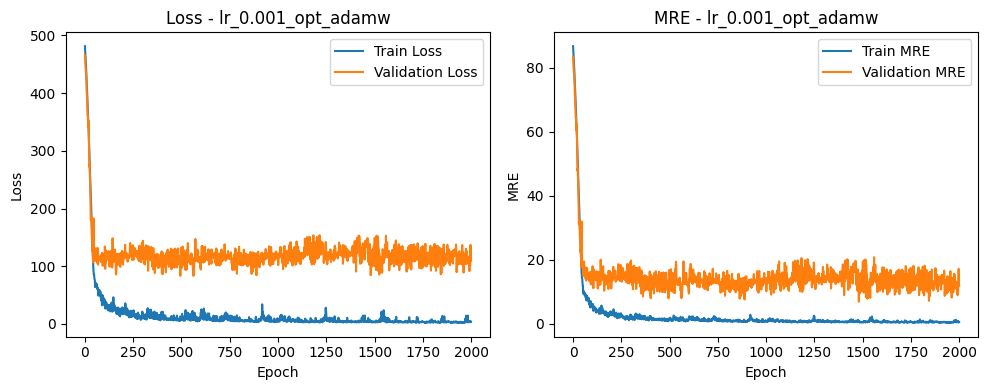

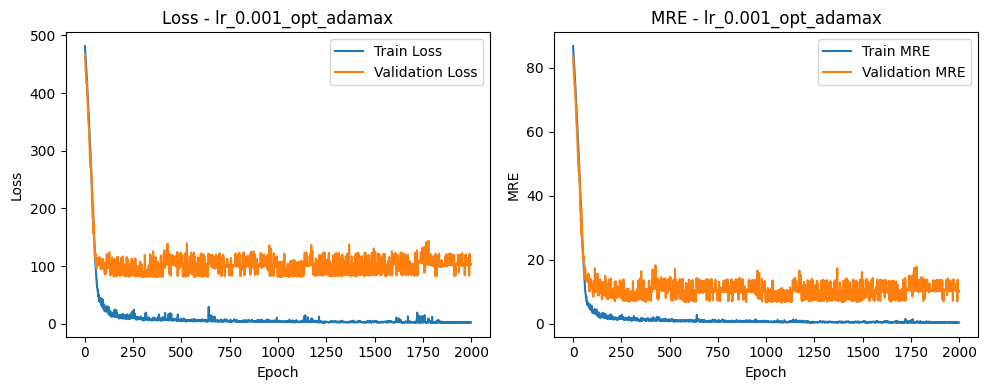

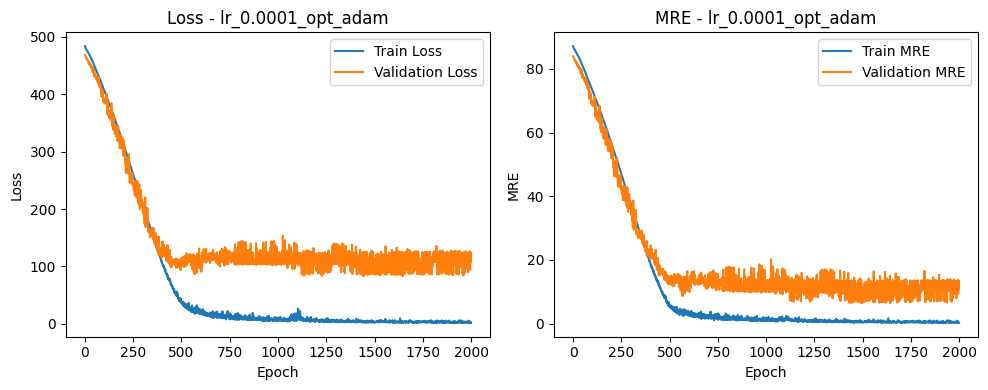

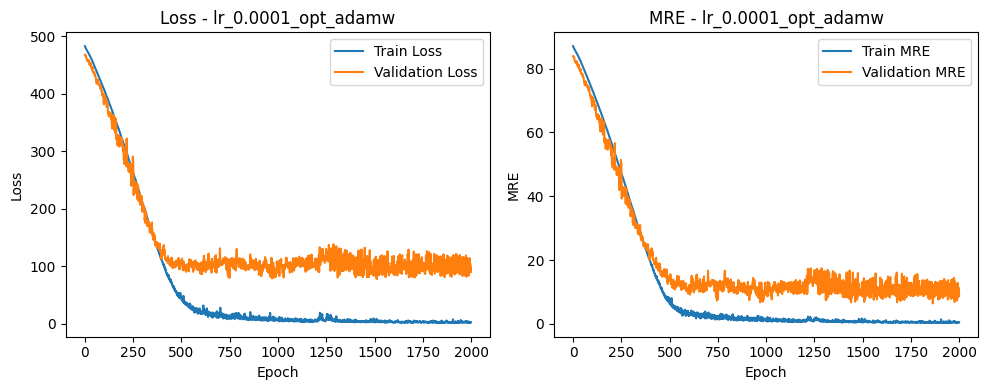

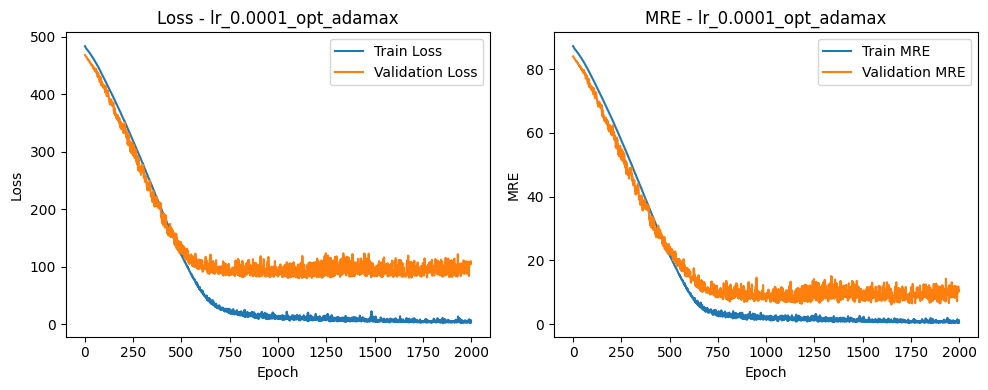

Grid search completed.
Best combination: Learning Rate = 0.0001, Optimizer = adamw, Validation Loss = 78.1006


In [39]:
for key, result in results_dict.items():
    plt.figure(figsize=(10, 4))

    # Plot training and validation loss
    plt.subplot(1, 2, 1)
    plt.plot(result['train_losses'], label='Train Loss')
    plt.plot(result['val_losses'], label='Validation Loss')
    plt.title(f'Loss - {key}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot training and validation MRE
    plt.subplot(1, 2, 2)
    plt.plot(result['train_mre'], label='Train MRE')
    plt.plot(result['val_mre'], label='Validation MRE')
    plt.title(f'MRE - {key}')
    plt.xlabel('Epoch')
    plt.ylabel('MRE')
    plt.legend()

    plt.tight_layout()
    plt.show()

# After all combinations
print("Grid search completed.")
print(f"Best combination: Learning Rate = {best_combination['learning_rate']}, Optimizer = {best_combination['optimizer']}, Validation Loss = {best_combination['val_loss']:.4f}")


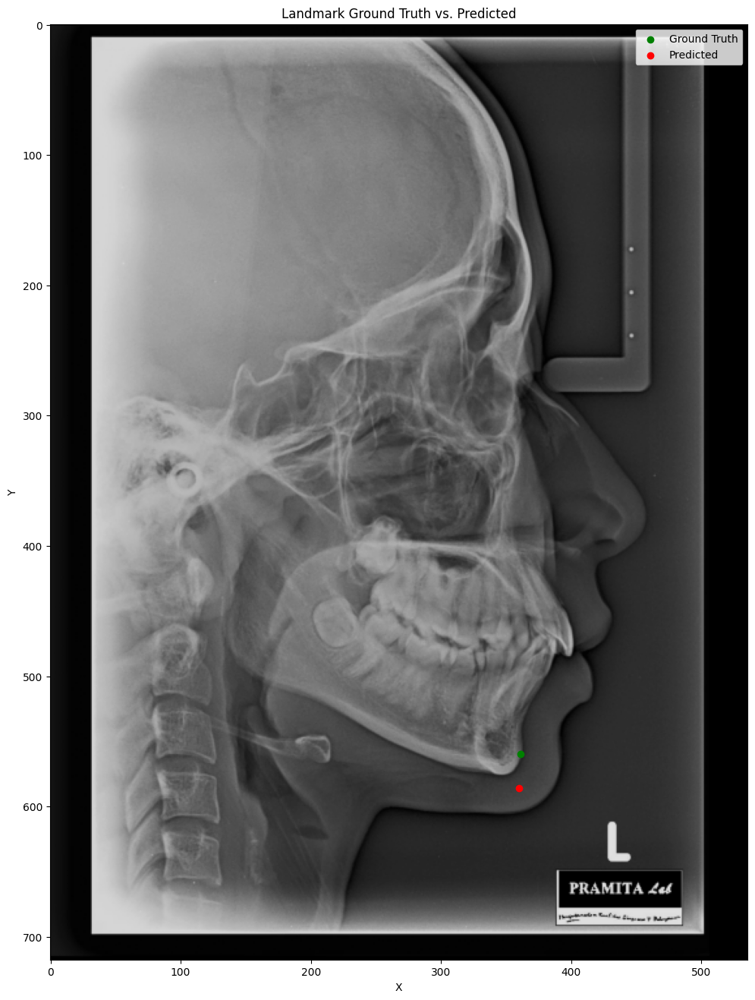

Mean Radial Error (MRE) in mm: 3.32


In [51]:
# Visualize predictions
# Specify the landmark index (0-based) to load the trained model for
landmark_idx = 0
asli = pd.read_csv('data_annot.csv')
model_path = f'hrnetv2_pretrained/tiap_titik_5/best_model_point_{landmark_idx+1}.pth'
# Function to load the model and make predictions
def prediksi_dan_visualisasikan(image_path, model_path):
    # Load the model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    pixel_per_mm = 7.8
    model = create_model('hrnet_w18', pretrained=False)
    model.classifier = nn.Linear(model.classifier.in_features, 1 * 2)

    state_dict = torch.load(model_path, map_location=device)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:
        state_dict.pop('conv1.bias')
    model.load_state_dict(state_dict, strict=False)

    first_conv_layer = model.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)
    model.conv1 = new_first_conv_layer

    model.to(device)
    model.eval()

    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))
    image = image / 255.0  # Normalize the image
    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

    # Make predictions
    with torch.no_grad():
        outputs = model(image)
        outputs = outputs.view(-1, 1, 2).cpu().numpy()

    return outputs

# Choose a random file_name from the test dataset
random_index = np.random.choice(len(test_dataset))
random_sample = test_dataset[random_index]
random_sample_index = test_dataset.indices[random_index]  # Get the original index

random_file_name = asli.iloc[random_sample_index]['file_name']
image_path = f'data/images/{random_file_name}'

predicted_landmarks = prediksi_dan_visualisasikan(image_path, model_path)

# Filter asli for the random file_name
asli_1 = asli[asli['file_name'] == random_file_name]
landmark_columns = asli_1.columns[asli_1.columns.str.endswith(('_x', '_y'))]
x_coords_true = asli_1[f'{landmark_columns[landmark_idx*2]}'].values.flatten()
y_coords_true = asli_1[f'{landmark_columns[landmark_idx*2 + 1]}'].values.flatten()
x_coords_pred = predicted_landmarks[0][:, 0]
y_coords_pred = predicted_landmarks[0][:, 1]
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(12, 16))
ax.imshow(image)
ax.scatter(x_coords_true, y_coords_true, c='g', label='Ground Truth')
ax.scatter(x_coords_pred, y_coords_pred, c='r', label='Predicted')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Landmark Ground Truth vs. Predicted')
ax.legend()
plt.show()

df_true = pd.DataFrame({'x': x_coords_true, 'y': y_coords_true, 'label': 'Ground Truth'})
df_pred = pd.DataFrame({'x': x_coords_pred, 'y': y_coords_pred, 'label': 'Predicted'})
df_combined = pd.concat([df_true, df_pred])

chart = alt.Chart(df_combined).mark_circle(size=100).encode(
    x='x',
    y='y',
    color='label',
    tooltip=['x', 'y', 'label']
).properties(
    title='Landmark Ground Truth vs. Predicted',
    width=800,
    height=600
).interactive()

# Calculate Mean Radial Error (MRE) in millimeters
errors_mm = np.sqrt(((x_coords_true - x_coords_pred) / pixel_per_mm) ** 2 +
                    ((y_coords_true - y_coords_pred) / pixel_per_mm) ** 2)
mre_mm = np.mean(errors_mm)
print(f'Mean Radial Error (MRE) in mm: {mre_mm:.2f}')

## Semua Titik

In [ ]:
# 3. Model (HRNet)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
hrnet = create_model('hrnet_w18', pretrained=False)
hrnet.load_state_dict(torch.load('/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

# Modify the first convolutional layer to expect 1 input channel
first_conv_layer = hrnet.conv1
new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding,
                                 bias=first_conv_layer.bias is not None)
hrnet.conv1 = new_first_conv_layer
hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)
hrnet.to(device)

# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

# Optimizer
optimizer = optim.Adam(hrnet.parameters(), lr=0.001)

def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

# Training parameters
patience = 500
pixel_per_mm = 7.8
best_val_loss = [float('inf')] * 32
epochs_without_improvement = [0] * 32
train_losses, val_losses = [[] for _ in range(32)], [[] for _ in range(32)]
train_mre, val_mre = [[] for _ in range(32)], [[] for _ in range(32)]
results = {
    "epoch": [],
    "train_loss": [[] for _ in range(32)],
    "val_loss": [[] for _ in range(32)],
    "train_mre": [[] for _ in range(32)],
    "val_mre": [[] for _ in range(32)],
    "mse": [[] for _ in range(32)],
    "rmse": [[] for _ in range(32)],
    "r2": [[] for _ in range(32)]
}
num_epochs = 1000

for epoch in range(num_epochs):
    hrnet.train()
    epoch_train_loss = [0.0] * 32
    epoch_train_mre = [0.0] * 32
    for images, landmarks in train_loader:
        images = images.to(device)
        landmarks = landmarks.to(device)
        optimizer.zero_grad()
        images = images.squeeze(2)
        outputs = hrnet(images)
        outputs = outputs.view(-1, 32, 2)
        for i in range(32):
            loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
            loss.backward(retain_graph=True if i < 31 else False)  # Only retain graph for the first 31 landmarks
            epoch_train_loss[i] += loss.item() * images.size(0)
            epoch_train_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
        optimizer.step()

    epoch_train_loss = [loss / len(train_loader.dataset) for loss in epoch_train_loss]
    epoch_train_mre = [mre / len(train_loader.dataset) for mre in epoch_train_mre]
    for i in range(32):
        train_losses[i].append(epoch_train_loss[i])
        train_mre[i].append(epoch_train_mre[i])

    hrnet.eval()
    epoch_val_loss = [0.0] * 32
    epoch_val_mre = [0.0] * 32
    all_outputs, all_targets = [[] for _ in range(32)], [[] for _ in range(32)]
    with torch.no_grad():
        for images, landmarks in val_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            outputs = outputs.view(-1, 32, 2)
            for i in range(32):
                loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
                epoch_val_loss[i] += loss.item() * images.size(0)
                epoch_val_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
                all_outputs[i].append(outputs[:, i].cpu().numpy())
                all_targets[i].append(landmarks[:, i].cpu().numpy())

    epoch_val_loss = [loss / len(val_loader.dataset) for loss in epoch_val_loss]
    epoch_val_mre = [mre / len(val_loader.dataset) for mre in epoch_val_mre]
    for i in range(32):
        val_losses[i].append(epoch_val_loss[i])
        val_mre[i].append(epoch_val_mre[i])
        all_outputs[i] = np.concatenate(all_outputs[i], axis=0)
        all_targets[i] = np.concatenate(all_targets[i], axis=0)
        mse = mean_squared_error(all_targets[i], all_outputs[i])
        rmse = np.sqrt(mse)
        r2 = r2_score(all_targets[i], all_outputs[i])

        results["train_loss"][i].append(epoch_train_loss[i])
        results["val_loss"][i].append(epoch_val_loss[i])
        results["train_mre"][i].append(epoch_train_mre[i])
        results["val_mre"][i].append(epoch_val_mre[i])
        results["mse"][i].append(mse)
        results["rmse"][i].append(rmse)
        results["r2"][i].append(r2)

        # Print progress for each point
        print(f"Epoch [{epoch+1}/{num_epochs}] - Point {i+1}: Train Loss = {epoch_train_loss[i]:.4f}, Val Loss = {epoch_val_loss[i]:.4f}, RMSE = {rmse:.4f}, MSE = {mse:.4f}, R² = {r2:.4f}, Train MRE = {epoch_train_mre[i]:.4f}, Val MRE = {epoch_val_mre[i]:.4f}")

        if epoch_val_loss[i] < best_val_loss[i]:
            best_val_loss[i] = epoch_val_loss[i]
            epochs_without_improvement[i] = 0
            torch.save(hrnet.state_dict(), f'/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/tiap_titik/best_model_point_{i+1}.pth')
        else:
            epochs_without_improvement[i] += 1
            if epochs_without_improvement[i] >= patience:
                print(f"Early stopping triggered for point {i+1}!")
                break

    results["epoch"].append(epoch + 1)
    print(f"Epoch [{epoch+1}/{num_epochs}] completed.")

# Save results to DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('/content/drive/MyDrive/TRYTRY/training_results_per_point.csv', index=False)

# Plotting the loss curves for each point
plt.figure(figsize=(20, 10))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_losses[i], label='Train Loss')
    plt.plot(range(1, epoch + 2), val_losses[i], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting the MRE curves for each point
plt.figure(figsize=(20, 10))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_mre[i], label='Train MRE')
    plt.plot(range(1, epoch + 2), val_mre[i], label='Validation MRE')
    plt.xlabel('Epoch')
    plt.ylabel('MRE')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

Epoch [1/1000] - Point 1: Train Loss = 481.3211, Val Loss = 465.1745, RMSE = 465.1745, MSE = 216387.2969, R² = -57.4207, Train MRE = 86.7500, Val MRE = 83.3684
Epoch [1/1000] - Point 2: Train Loss = 479.7406, Val Loss = 472.1653, RMSE = 472.1653, MSE = 222940.0312, R² = -20.0750, Train MRE = 85.8570, Val MRE = 83.6553
Epoch [1/1000] - Point 3: Train Loss = 393.4292, Val Loss = 412.9909, RMSE = 412.9909, MSE = 170561.4688, R² = -73.7383, Train MRE = 71.1998, Val MRE = 74.4211
Epoch [1/1000] - Point 4: Train Loss = 339.7594, Val Loss = 349.1745, RMSE = 349.1745, MSE = 121922.8438, R² = -104.8255, Train MRE = 61.3395, Val MRE = 62.7931
Epoch [1/1000] - Point 5: Train Loss = 327.8541, Val Loss = 335.5487, RMSE = 335.5487, MSE = 112592.9531, R² = -16.7399, Train MRE = 59.2492, Val MRE = 60.5003
Epoch [1/1000] - Point 6: Train Loss = 379.2284, Val Loss = 382.6315, RMSE = 382.6315, MSE = 146406.8750, R² = -78.9275, Train MRE = 68.3894, Val MRE = 69.1892
Epoch [1/1000] - Point 7: Train Loss = 

KeyboardInterrupt: 

In [ ]:
# 3. Model (HRNet)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
hrnet = create_model('hrnet_w18', pretrained=False)
hrnet.load_state_dict(torch.load('/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/hrnetv2_w18_imagenet_pretrained.pth'))

# Modify the first convolutional layer to expect 1 input channel
first_conv_layer = hrnet.conv1
new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding,
                                 bias=first_conv_layer.bias is not None)
hrnet.conv1 = new_first_conv_layer
hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)
hrnet.to(device)

# Define RMSE loss function
def root_mean_squared_error(pred, target):
    loss = torch.sqrt(torch.mean((pred - target) ** 2))
    return loss

# Optimizer
optimizer = optim.Adam(hrnet.parameters(), lr=0.001)

def mean_radial_error(pred, target, pixel_per_mm):
    pred = pred.view(-1, 1, 2)
    target = target.view(-1, 1, 2)
    error = torch.sqrt(torch.sum((pred - target) ** 2, dim=2)) / pixel_per_mm
    return error.mean().item()

# Training parameters
patience = 500
pixel_per_mm = 7.8
best_val_loss = [float('inf')] * 32
epochs_without_improvement = [0] * 32
train_losses, val_losses = [[] for _ in range(32)], [[] for _ in range(32)]
train_mre, val_mre = [[] for _ in range(32)], [[] for _ in range(32)]
results = {
    "epoch": [],
    "train_loss": [[] for _ in range(32)],
    "val_loss": [[] for _ in range(32)],
    "train_mre": [[] for _ in range(32)],
    "val_mre": [[] for _ in range(32)],
    "mse": [[] for _ in range(32)],
    "rmse": [[] for _ in range(32)],
    "r2": [[] for _ in range(32)]
}
num_epochs = 1000

for epoch in range(num_epochs):
    hrnet.train()
    epoch_train_loss = [0.0] * 32
    epoch_train_mre = [0.0] * 32
    for images, landmarks in train_loader:
        images = images.to(device)
        landmarks = landmarks.to(device)
        optimizer.zero_grad()
        images = images.squeeze(2)
        outputs = hrnet(images)
        outputs = outputs.view(-1, 32, 2)
        for i in range(32):
            loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
            loss.backward(retain_graph=True if i < 31 else False)  # Only retain graph for the first 31 landmarks
            epoch_train_loss[i] += loss.item() * images.size(0)
            epoch_train_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
        optimizer.step()

    epoch_train_loss = [loss / len(train_loader.dataset) for loss in epoch_train_loss]
    epoch_train_mre = [mre / len(train_loader.dataset) for mre in epoch_train_mre]
    for i in range(32):
        train_losses[i].append(epoch_train_loss[i])
        train_mre[i].append(epoch_train_mre[i])

    hrnet.eval()
    epoch_val_loss = [0.0] * 32
    epoch_val_mre = [0.0] * 32
    all_outputs, all_targets = [[] for _ in range(32)], [[] for _ in range(32)]
    with torch.no_grad():
        for images, landmarks in val_loader:
            images = images.to(device)
            landmarks = landmarks.to(device)
            images = images.squeeze(2)
            outputs = hrnet(images)
            outputs = outputs.view(-1, 32, 2)
            for i in range(32):
                loss = root_mean_squared_error(outputs[:, i], landmarks[:, i])
                epoch_val_loss[i] += loss.item() * images.size(0)
                epoch_val_mre[i] += mean_radial_error(outputs[:, i], landmarks[:, i], pixel_per_mm) * images.size(0)
                all_outputs[i].append(outputs[:, i].cpu().numpy())
                all_targets[i].append(landmarks[:, i].cpu().numpy())

    epoch_val_loss = [loss / len(val_loader.dataset) for loss in epoch_val_loss]
    epoch_val_mre = [mre / len(val_loader.dataset) for mre in epoch_val_mre]
    for i in range(32):
        val_losses[i].append(epoch_val_loss[i])
        val_mre[i].append(epoch_val_mre[i])
        all_outputs[i] = np.concatenate(all_outputs[i], axis=0)
        all_targets[i] = np.concatenate(all_targets[i], axis=0)
        mse = mean_squared_error(all_targets[i], all_outputs[i])
        rmse = np.sqrt(mse)
        r2 = r2_score(all_targets[i], all_outputs[i])

        results["train_loss"][i].append(epoch_train_loss[i])
        results["val_loss"][i].append(epoch_val_loss[i])
        results["train_mre"][i].append(epoch_train_mre[i])
        results["val_mre"][i].append(epoch_val_mre[i])
        results["mse"][i].append(mse)
        results["rmse"][i].append(rmse)
        results["r2"][i].append(r2)

        # Print progress for each point
        print(f"Epoch [{epoch+1}/{num_epochs}] - Point {i+1}: Train Loss = {epoch_train_loss[i]:.4f}, Val Loss = {epoch_val_loss[i]:.4f}, RMSE = {rmse:.4f}, MSE = {mse:.4f}, R² = {r2:.4f}, Train MRE = {epoch_train_mre[i]:.4f}, Val MRE = {epoch_val_mre[i]:.4f}")

        if epoch_val_loss[i] < best_val_loss[i]:
            best_val_loss[i] = epoch_val_loss[i]
            epochs_without_improvement[i] = 0
            torch.save(hrnet.state_dict(), f'/content/drive/MyDrive/TRYTRY/hrnetv2_pretrained/tiap_titik/best_model_point_{i+1}.pth')
        else:
            epochs_without_improvement[i] += 1
            if epochs_without_improvement[i] >= patience:
                print(f"Early stopping triggered for point {i+1}!")
                break

    results["epoch"].append(epoch + 1)
    print(f"Epoch [{epoch+1}/{num_epochs}] completed.")

# Save results to DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('/content/drive/MyDrive/TRYTRY/training_results_per_point.csv', index=False)

# Plotting the loss curves for each point
plt.figure(figsize=(20, 10))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_losses[i], label='Train Loss')
    plt.plot(range(1, epoch + 2), val_losses[i], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting the MRE curves for each point
plt.figure(figsize=(20, 10))
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(range(1, epoch + 2), train_mre[i], label='Train MRE')
    plt.plot(range(1, epoch + 2), val_mre[i], label='Validation MRE')
    plt.xlabel('Epoch')
    plt.ylabel('MRE')
    plt.title(f'Point {i+1}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

# Model Lama

In [ ]:
def prediksi_dan_visualisasikan(image_path, model_path):
    # Muat model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hrnet = create_model('hrnet_w18', pretrained=False)
    hrnet.classifier = nn.Linear(hrnet.classifier.in_features, 32 * 2)

    # Load state dict without conv1 layer if it exists
    state_dict = torch.load(model_path)
    if 'conv1.weight' in state_dict:
        state_dict.pop('conv1.weight')
    if 'conv1.bias' in state_dict:  # Check if 'conv1.bias' exists
        state_dict.pop('conv1.bias')
    hrnet.load_state_dict(state_dict, strict=False)

    # Create new first conv layer to accept a single-channel grayscale image
    first_conv_layer = hrnet.conv1
    new_first_conv_layer = nn.Conv2d(1, first_conv_layer.out_channels,
                                kernel_size=first_conv_layer.kernel_size,
                                stride=first_conv_layer.stride,
                                padding=first_conv_layer.padding,
                                bias=first_conv_layer.bias is not None)  # Check if bias exists

    # Replace the original first layer with the modified layer
    hrnet.conv1 = new_first_conv_layer

    hrnet.to(device)
    hrnet.eval()

    # Muat dan praproses gambar
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))
    original_image = image.copy()
    image = transform(image).unsqueeze(0).to(device)

    # Prediksi
    with torch.no_grad():
        outputs = hrnet(image) # remove squeeze(1) because it's already batched
        predicted_landmarks = outputs.view(-1, 32, 2).cpu().numpy()

    return predicted_landmarks

In [ ]:
nama_file = 'BAGUS AJI WIBOWO.jpeg.png'
image_path = f'/content/drive/MyDrive/TRYTRY/data/images/{nama_file}'  # Ganti dengan path gambar Anda
model_path = '/content/best_model.pth'             # Path ke model yang disimpan

predicted_landmarks = prediksi_dan_visualisasikan(image_path, model_path)

In [ ]:
asli = pd.read_csv('/content/drive/MyDrive/TRYTRY/data_annot.csv')

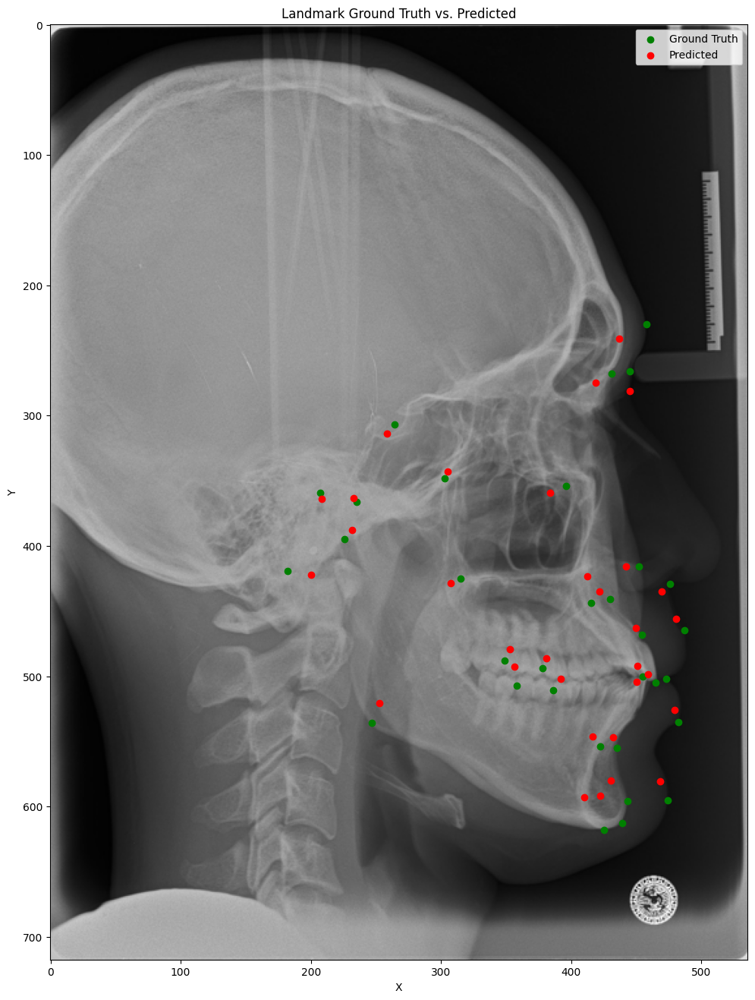

Mean Radial Error (MRE) in mm: 1.64


In [ ]:
import cv2
import matplotlib.pyplot as plt
import altair as alt
import pandas as pd

asli_1 = asli[asli['file_name'] == nama_file]

# 1. Filter column names
landmark_columns = asli_1.columns[asli_1.columns.str.endswith(('_x', '_y'))]

# 2. Extract x and y coordinates from asli_1
x_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_x')]].values.flatten()
y_coords_true = asli_1[landmark_columns[landmark_columns.str.endswith('_y')]].values.flatten()

# 3. Extract x and y coordinates from predicted_landmarks
x_coords_pred = predicted_landmarks[0][:, 0]
y_coords_pred = predicted_landmarks[0][:, 1]

# 4. Load and convert image to RGB
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 5. Create figure and axis with larger size
fig, ax = plt.subplots(figsize=(12, 16))

# 6. Display the image
ax.imshow(image)

# 7. Scatter plot of ground truth landmarks (green)
ax.scatter(x_coords_true, y_coords_true, c='g', label='Ground Truth')

# 8. Scatter plot of predicted landmarks (red)
ax.scatter(x_coords_pred, y_coords_pred, c='r', label='Predicted')

# Add labels and legend
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Landmark Ground Truth vs. Predicted')
ax.legend()

# Show the plot
plt.show()

# Create a DataFrame for Altair
df_true = pd.DataFrame({'x': x_coords_true, 'y': y_coords_true, 'label': 'Ground Truth'})
df_pred = pd.DataFrame({'x': x_coords_pred, 'y': y_coords_pred, 'label': 'Predicted'})
df_combined = pd.concat([df_true, df_pred])

# Create the Altair chart with larger size
chart = alt.Chart(df_combined).mark_circle(size=100).encode(
    x='x',
    y='y',
    color='label',
    tooltip=['x', 'y', 'label']
).properties(
    title='Landmark Ground Truth vs. Predicted',
    width=800,
    height=600
).interactive()

pixel_per_mm = 7.8

# Calculate Mean Radial Error (MRE) in millimeters
errors_mm = np.sqrt(((x_coords_true - x_coords_pred) / pixel_per_mm) ** 2 +
                    ((y_coords_true - y_coords_pred) / pixel_per_mm) ** 2)
mre_mm = np.mean(errors_mm)
print(f'Mean Radial Error (MRE) in mm: {mre_mm:.2f}')